In [1]:
import Radiography_Library as RadLib

directory = 'RESULTS/'
rootnames = ["prueba_40k", "prueba_80k"]
rootnames = ["Dexa40", "Dexa80"]
rootnames = ["RC40K100M", "RC80K100M"]
rootnames = ["Sim80kvp", "Sim140kvp"]
rootnames = ["mono40k_2", "mono80k_2"]

tree_name = "Photons"
x_branch  = "X_axis"
y_branch  = "Y_axis"

x_1, y_1, x_2, y_2 = RadLib.LoadRoots(directory, rootnames, tree_name, x_branch, y_branch)

Dataframes created


In [2]:
import matplotlib.pyplot as plt

x_shift = 0.0
y_shift = 10

size = 150
log_factor = 0.1

low_energy_img, xlim, ylim  = RadLib.Heatmap_from_Dask(x_1, y_1, size, log_factor, x_shift, y_shift, '')
high_energy_img, xlim, ylim = RadLib.Heatmap_from_Dask(x_2, y_2, size, log_factor, x_shift, y_shift, '')

plt.close(); plt.close()

Heatmap size: (600, 600) [pixels]
Heatmap size: (600, 600) [pixels]


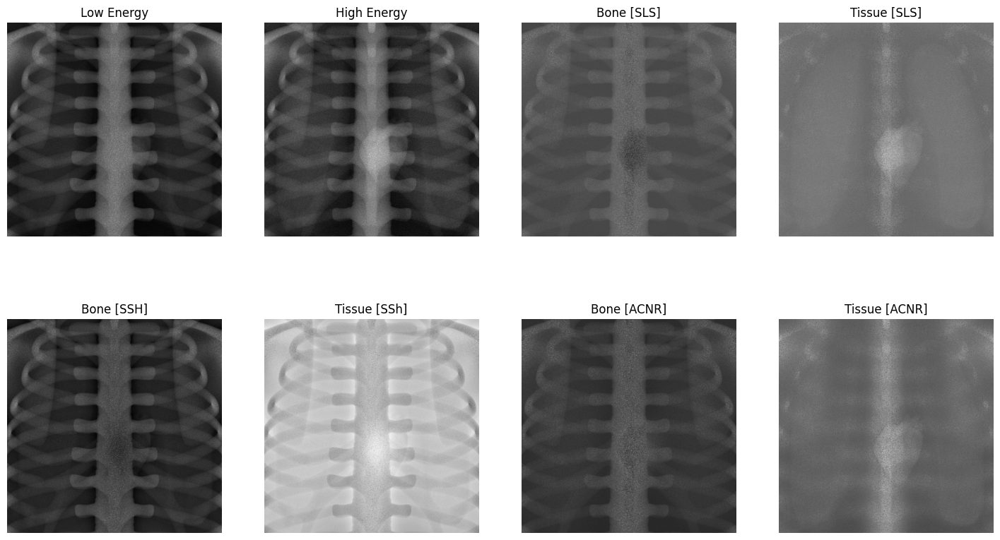

In [92]:
def IsolateTissues(low_energy_img, high_energy_img, sigma1, sigma2, wn, save_in, 
                   save_as_1, save_as_2, save_as_3, save_as_4, save_as_5, save_as_6, save_as_7, save_as_8):

    from scipy.ndimage import gaussian_filter
    import matplotlib.pyplot as plt

    U_b_l = 0.75187 # mu1
    U_b_h = 0.301189 # mu2
    U_t_l = 0.28283 # mu3
    U_t_h = 0.19155 # mu4

    SLS_Bone = ( (U_t_h/U_t_l) * low_energy_img ) - high_energy_img
    SLS_Tissue = high_energy_img - ( low_energy_img * (U_b_h/U_b_l) )

    SSH_Bone = ( (U_t_h/U_t_l) * low_energy_img) - gaussian_filter(high_energy_img, sigma = sigma1)
    SSH_Tissue = gaussian_filter(high_energy_img, sigma = sigma1) - ( low_energy_img * (U_b_h/U_b_l) )

    ACNR_Bone     = SLS_Bone +  gaussian_filter(SLS_Tissue, sigma = sigma1) - 1
    ACNR_SSH_Bone = SSH_Bone + (gaussian_filter(SSH_Tissue, sigma = sigma2) * wn) - 1
    ACNR_Tissue   = SLS_Tissue + gaussian_filter(SLS_Bone, sigma = sigma1) - 1

    plt.imshow(low_energy_img, cmap='gray'); plt.axis('off')
    if save_as_1 != '': plt.savefig(save_in + save_as_1, bbox_inches = 'tight', dpi = 600); plt.close()
    plt.imshow(high_energy_img, cmap='gray'); plt.axis('off')
    if save_as_2 != '': plt.savefig(save_in + save_as_2, bbox_inches = 'tight', dpi = 600); plt.close()
    plt.imshow(SLS_Bone, cmap='gray'); plt.axis('off')
    if save_as_3 != '': plt.savefig(save_in + save_as_3, bbox_inches = 'tight', dpi = 600); plt.close()
    plt.imshow(SLS_Tissue, cmap='gray'); plt.axis('off')
    if save_as_4 != '': plt.savefig(save_in + save_as_4, bbox_inches = 'tight', dpi = 600); plt.close()
    plt.imshow(SSH_Bone, cmap='gray'); plt.axis('off')
    if save_as_5 != '': plt.savefig(save_in + save_as_5, bbox_inches = 'tight', dpi = 600); plt.close()
    plt.imshow(SSH_Tissue, cmap='gray'); plt.axis('off')
    if save_as_6 != '': plt.savefig(save_in + save_as_6, bbox_inches = 'tight', dpi = 600); plt.close()
    plt.imshow(ACNR_Bone, cmap='gray'); plt.axis('off')
    if save_as_7 != '': plt.savefig(save_in + save_as_7, bbox_inches = 'tight', dpi = 600); plt.close()
    plt.imshow(ACNR_Tissue, cmap='gray'); plt.axis('off')
    if save_as_8 != '': plt.savefig(save_in + save_as_8, bbox_inches = 'tight', dpi = 600); 
    plt.close()

    plt.figure(figsize = (18, 10))
    plt.tight_layout()
    plt.subplot(2, 4, 1); plt.imshow(low_energy_img,  cmap='gray'); plt.axis('off');  plt.title("Low Energy")
    plt.subplot(2, 4, 2); plt.imshow(high_energy_img, cmap='gray'); plt.axis('off');  plt.title("High Energy")
    plt.subplot(2, 4, 3); plt.imshow(SLS_Bone,        cmap='gray'); plt.axis('off');  plt.title("Bone [SLS]")
    plt.subplot(2, 4, 4); plt.imshow(SLS_Tissue,      cmap='gray'); plt.axis('off');  plt.title("Tissue [SLS]")
    plt.subplot(2, 4, 5); plt.imshow(SSH_Bone,        cmap='gray'); plt.axis('off');  plt.title("Bone [SSH]")
    plt.subplot(2, 4, 6); plt.imshow(SSH_Tissue,      cmap='gray'); plt.axis('off');  plt.title("Tissue [SSh]")
    plt.subplot(2, 4, 7); plt.imshow(ACNR_Bone,       cmap='gray'); plt.axis('off');  plt.title("Bone [ACNR]")
    # plt.subplot(2, 4, 8); plt.imshow(ACNR_SSH_Bone,     cmap='gray'); plt.axis('off');  plt.title("Bone [ACNR + SSH]")
    plt.subplot(2, 4, 8); plt.imshow(ACNR_Tissue,     cmap='gray'); plt.axis('off');  plt.title("Tissue [ACNR]")
   
    return SLS_Bone, SSH_Bone, ACNR_Bone, ACNR_Tissue

sg = 20

sigma1 = sg
sigma2 = sg
wn = 1

save_in = ''
save_as_1 = ''
save_as_2 = ''
save_as_3 = ''
save_as_4 = ''
save_as_5 = ''
save_as_6 = ''
save_as_7 = ''
save_as_8 = ''

SLS_Bone, SSH_Bone, ACNR_Bone, ACNR_Tissue = IsolateTissues(low_energy_img, high_energy_img, sigma1, sigma2, wn, save_in, 
                                                              save_as_1, save_as_2, save_as_3, save_as_4, save_as_5, save_as_6, save_as_7, save_as_8)

In [98]:
def Plotly_Heatmap(array, xlim, ylim, title, x_label, y_label, annotation, width, height, save_as):

    import plotly.graph_objects as go
    import plotly.io as pio

    font_family = 'Merriweather'
    family_2    = 'Optima'
    font_small  = 18
    font_medium = 20
    font_large  = 18

    fig = go.Figure(go.Heatmap(z = array, x = xlim, y = ylim,
                                colorscale = [[0, 'black'], [1, 'white']], showscale = False,
                                colorbar = dict(title = "Density", tickfont = dict(family = family_2, size = 15, color = 'Black'))))
    
    fig.update_layout(
                    title = dict(text = title, font = dict(family = font_family, size = font_large, color = "Black"), 
                                 x = 0.51, y = 0.93, yanchor = 'middle', xanchor = 'center'),
                    xaxis_title = dict(text = x_label, font = dict(family = font_family, size = font_medium, color = "Black")),
                    yaxis_title = dict(text = y_label, font = dict(family = font_family, size = font_medium, color = "Black")),
                    xaxis = dict(tickfont = dict(family = family_2, size = font_small, color = "Black"), title_standoff = 25),
                    yaxis = dict(tickfont = dict(family = family_2, size = font_small, color = "Black"), title_standoff = 10, range=[max(xlim), min(xlim)],
                                 showticklabels = False
                                ),
                    width = width, height = height, margin = dict(l = 105, r = 90, t = 90, b = 90),)
                    # annotations = [dict(x = 0.95, y = 0.15,  xref = 'paper', yref = 'paper', showarrow = False,
                    #                     font = dict(family = family_2, size = 18, color = "White"),
                    #                     bgcolor = "rgba(255, 255, 255, 0.1)", borderpad = 8, bordercolor = "White", borderwidth = 0.2,
                    #                     text = annotation)])

    # fig.add_shape(type = "rect", line = dict(color = "blue", width = 2), fillcolor = "rgba(0, 0, 0, 0)",
    #               x0 = 51, y0 = -6, x1 = -54, y1 = 8) 
    
    # fig.add_shape(type = "rect", line = dict(color = "red", width = 2), fillcolor = "rgba(0, 0, 0, 0)",
    #               x0 = 26, y0 = 12, x1 = 48, y1 = 18) 
   
    if save_as != '': pio.write_image(fig, save_as + '.png', width = width, height = height, scale = 5)
    fig.show()


array = low_energy_img
array = ACNR_Bone
array = ACNR_Tissue

title   = r"$ \large{ \text{Low energy projection (40 keV), 100M Photons} } $"
title   = r"$ \large{ \text{ACNR Tissue Projection (40, 80 keV), 100M Photons} } $"
x_label = r"$ \large{ \text{X Axis} \ (mm)} $"
y_label = r"$ \large{ \text{Y Axis} \ (mm)} $"
y_label = ''

annotation = '' 

width  = 700
height = 700

save_as = 'cnr_tissue'

Plotly_Heatmap(array, xlim, ylim, title, x_label, y_label, annotation, width, height, save_as)